# We will review stored measures to determine if there are oppurtunities to impact or prevent Churn.

In [ ]:
Linear Scaling 	 When the feature is more-or-less uniformly distributed across a fixed range.
Clipping 	When the feature contains some extreme outliers.
if x > max, then x' = max. if x < min, then x' = min 
Log Scaling 	
x' = log(x) 	When the feature conforms to the power law.
Z-score 	
x' = (x - μ) / σ 	When the feature distribution does not contain extreme outliers.

# Required features

Using some basic EDA(Exploratory Data Analysis)examples; head, describe, shape, info and subsets I researched the data to become familiar with dimensions, measures. From there I removed duplicates, dropped ID fields and fields such as LNG and LAT that offered duplication or low level granularity that does not help with overall model. 

In [1]:
import pandas as pd
# Load dataset
df = pd.read_csv('C://Users//msmorris//Desktop//Churn_example//churn_raw_data.csv')
df = df.replace(" ", "")

df.head()


,Unnamed: 0,CaseOrder,Customer_id,Interaction,City,State,County,Zip,Lat,Lng,...,MonthlyCharge,Bandwidth_GB_Year,item1,item2,item3,item4,item5,item6,item7,item8
0,1,1,K409198,aa90260b-4141-4a24-8e36-b04ce1f4f77b,Point Baker,AK,Prince of Wales-Hyder,99927,56.25100,-133.37571,...,171.449762,904.536110,5,5,5,3,4,4,3,4
1,2,2,S120509,fb76459f-c047-4a9d-8af9-e0f7d4ac2524,West Branch,MI,Ogemaw,48661,44.32893,-84.24080,...,242.948015,800.982766,3,4,3,3,4,3,4,4
2,3,3,K191035,344d114c-3736-4be5-98f7-c72c281e2d35,Yamhill,OR,Yamhill,97148,45.35589,-123.24657,...,159.440398,2054.706961,4,4,2,4,4,3,3,3
3,4,4,D90850,abfa2b40-2d43-4994-b15a-989b8c79e311,Del Mar,CA,San Diego,92014,32.96687,-117.24798,...,120.249493,2164.579412,4,4,4,2,5,4,3,3
4,5,5,K662701,68a861fd-0d20-4e51-a587-8a90407ee574,Needville,TX,Fort Bend,77461,29.38012,-95.80673,...,150.761216,271.493436,4,4,4,3,4,4,4,5


In [2]:
df.shape

(10000, 52)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 52 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            10000 non-null  int64  
 1   CaseOrder             10000 non-null  int64  
 2   Customer_id           10000 non-null  object 
 3   Interaction           10000 non-null  object 
 4   City                  10000 non-null  object 
 5   State                 10000 non-null  object 
 6   County                10000 non-null  object 
 7   Zip                   10000 non-null  int64  
 8   Lat                   10000 non-null  float64
 9   Lng                   10000 non-null  float64
 10  Population            10000 non-null  int64  
 11  Area                  10000 non-null  object 
 12  Timezone              10000 non-null  object 
 13  Job                   10000 non-null  object 
 14  Children              7505 non-null   float64
 15  Age                 

In [4]:
df_unique = {col: df[col].unique() for col in df}
print(df_unique)

{'Unnamed: 0': array([    1,     2,     3, ...,  9998,  9999, 10000], dtype=int64), 'CaseOrder': array([    1,     2,     3, ...,  9998,  9999, 10000], dtype=int64), 'Customer_id': array(['K409198', 'S120509', 'K191035', ..., 'I243405', 'I641617',
       'T38070'], dtype=object), 'Interaction': array(['aa90260b-4141-4a24-8e36-b04ce1f4f77b',
       'fb76459f-c047-4a9d-8af9-e0f7d4ac2524',
       '344d114c-3736-4be5-98f7-c72c281e2d35', ...,
       'e8307ddf-9a01-4fff-bc59-4742e03fd24f',
       '3775ccfc-0052-4107-81ae-9657f81ecdf3',
       '9de5fb6e-bd33-4995-aec8-f01d0172a499'], dtype=object), 'City': array(['Point Baker', 'West Branch', 'Yamhill', ..., 'Haubstadt',
       'West Kill', 'Clarkesville'], dtype=object), 'State': array(['AK', 'MI', 'OR', 'CA', 'TX', 'GA', 'TN', 'OK', 'FL', 'OH', 'PA',
       'PR', 'IA', 'ME', 'IL', 'WI', 'NC', 'AL', 'NM', 'VT', 'MD', 'NY',
       'WA', 'CT', 'NJ', 'DC', 'ND', 'LA', 'NE', 'WV', 'AZ', 'MO', 'WY',
       'MT', 'VA', 'KY', 'MN', 'KS', 'MA', 'IN'

In [5]:
# Need to print header with this
for col in df:
    if df[col].isna().sum()> 0:
        print(df[[col]].isna().sum())


Children    2495
dtype: int64
Age    2475
dtype: int64
Income    2490
dtype: int64
Techie    2477
dtype: int64
Phone    1026
dtype: int64
TechSupport    991
dtype: int64
Tenure    931
dtype: int64
Bandwidth_GB_Year    1021
dtype: int64


# Plan to find Anomolies

1) Remove ID fields and low level grain

2) Remove duplicates

3) Impute missing values using combination of linear interpoltation and Median and SimpleImputer

4) Rename fields & create catagories 

5) Visualize data




# Justification of Approach

I will be removing fields and duplicate along with imputing missing values using linear interpolation and ffill.
This will set me up to build out univariate, bivariate and multivariate stats to understand the distribution of data
for correlations related to Churn I will either use Churn as a hue/color element or use Tenure as Tenure 
and Churn are a 1 to 1 relationship.




# Justifaction of Tool

I have chosen to use python as future development of the process would work for production. Python works as a better production tool. 
Libraries used:

DATA PREPERATION

Numpy in order to create arrays

Pandas for data frames 


DATA VISUALIZATION

Matplotlib 

Seaborn


STATS MODELS

from scipy import stats

from sklearn import preprocessing

import statsmodels.api as sm

from sklearn.decomposition import PCA

from statsmodels.formula.api import ols

from statsmodels.stats.diagnostic import het_breuschpagan

from statsmodels.stats.diagnostic import het_white




# Code

In [6]:
df.isna().sum()

Unnamed: 0                 0
CaseOrder                  0
Customer_id                0
Interaction                0
City                       0
State                      0
County                     0
Zip                        0
Lat                        0
Lng                        0
Population                 0
Area                       0
Timezone                   0
Job                        0
Children                2495
Age                     2475
Education                  0
Employment                 0
Income                  2490
Marital                    0
Gender                     0
Churn                      0
Outage_sec_perweek         0
Email                      0
Contacts                   0
Yearly_equip_failure       0
Techie                  2477
Contract                   0
Port_modem                 0
Tablet                     0
InternetService            0
Phone                   1026
Multiple                   0
OnlineSecurity             0
OnlineBackup  

### Remove ID fields and low level grain

In [7]:
df.shape

(10000, 52)

In [8]:
df = df.drop([ 'Unnamed: 0','CaseOrder', 'Customer_id', 'Interaction', 'Lat', 'Lng', 'Timezone', 'County', 'Zip', 'Area', 'City'], axis = 1)
df.isna().sum()

State                      0
Population                 0
Job                        0
Children                2495
Age                     2475
Education                  0
Employment                 0
Income                  2490
Marital                    0
Gender                     0
Churn                      0
Outage_sec_perweek         0
Email                      0
Contacts                   0
Yearly_equip_failure       0
Techie                  2477
Contract                   0
Port_modem                 0
Tablet                     0
InternetService            0
Phone                   1026
Multiple                   0
OnlineSecurity             0
OnlineBackup               0
DeviceProtection           0
TechSupport              991
StreamingTV                0
StreamingMovies            0
PaperlessBilling           0
PaymentMethod              0
Tenure                   931
MonthlyCharge              0
Bandwidth_GB_Year       1021
item1                      0
item2         

In [9]:
df.shape

(10000, 41)

### Remove Duplicates

In [10]:
# Drop Duplicates
df = df.drop_duplicates()
df.shape

(10000, 41)

### Impute missing values using combination of linear interpoltation and ffill

In [11]:
import numpy as np
import matplotlib.pyplot as plt
plt.rc('figure', max_open_warning = 0) # remove runtime warning
import seaborn as sns
# Import necessary libraries
from numpy import sqrt, random, array, argsort
from sklearn.preprocessing import scale

In [12]:
df['Children'].interpolate(method='linear', direction = 'forward', inplace=True)
df['Age'].interpolate(method='linear', direction = 'forward', inplace=True)
df['Income'].interpolate(method='linear', direction = 'forward', inplace=True)
df['Tenure'].interpolate(method='linear', direction = 'forward', inplace=True)
df['Bandwidth_GB_Year'].interpolate(method='linear', direction = 'forward', inplace=True)
df['Children'].fillna(df['Children'].median(), inplace = True)

import pandas as pd
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
df['Techie'] = imp.fit_transform(df[['Techie']])
df['TechSupport'] = imp.fit_transform(df[['TechSupport']])
df['Phone'] = imp.fit_transform(df[['Phone']])

In [13]:
df['Children'].fillna(df['Children'].median(), inplace = True)
df.isnull().sum()

State                   0
Population              0
Job                     0
Children                0
Age                     0
Education               0
Employment              0
Income                  0
Marital                 0
Gender                  0
Churn                   0
Outage_sec_perweek      0
Email                   0
Contacts                0
Yearly_equip_failure    0
Techie                  0
Contract                0
Port_modem              0
Tablet                  0
InternetService         0
Phone                   0
Multiple                0
OnlineSecurity          0
OnlineBackup            0
DeviceProtection        0
TechSupport             0
StreamingTV             0
StreamingMovies         0
PaperlessBilling        0
PaymentMethod           0
Tenure                  0
MonthlyCharge           0
Bandwidth_GB_Year       0
item1                   0
item2                   0
item3                   0
item4                   0
item5                   0
item6       

In [14]:
for col in df:
    if df[col].isna().sum()> 0:
        print(df[col].isna().sum())

In [15]:
# Convert duration to integer
for col in df:
    if df[col].dtype == 'float':
        df[col] = df[col].astype(int)
        print(df[col].dtype)
    

int32
int32
int32
int32
int32
int32
int32


# Rename fields, Create Categories

In [16]:
df['Education_Rank'] = df['Education']
df.Education_Rank.replace([
    'No Schooling Completed', 
    'Nursery School to 8th Grade',
    '9th Grade to 12th Grade, No Diploma',
    'GED or Alternative Credential',
    'Regular High School Diploma',
    'Some College, Less than 1 Year',
    'Some College, 1 or More Years, No Degree',
    'Professional School Degree',
    "Associate's Degree",
    "Bachelor's Degree", 
    "Master's Degree",
    'Doctorate Degree'],[0,1,2,3,4,5,6,7,8,9,10,11], inplace = True )
df['Education_Rank'].unique()

array([10,  4, 11,  0,  8,  9,  5,  3,  6,  2,  1,  7], dtype=int64)

# Create Groups or fields

In [17]:
# rename item fields
col = df.columns.values
item_desc= (['Timely_response', 'Timely_fixes', 'Timely_replacements', 
            'Reliability', 'Options','Respectful_response', 
            'Courteous_exchange', 'Evidence_of_active_listening'])
col[-8:]= item_desc
df.columns = col
# Items_total group
df['items_total'] = (df['Timely_response'] + df['Timely_response'] + 
               df['Timely_fixes']+ df['Timely_replacements']+ 
               df['Reliability']+ df['Options']+
               df['Respectful_response']+ df['Courteous_exchange']+
               df['Evidence_of_active_listening'])

In [18]:
# Location group
location = df[['State', 'Population']]

# Demographic group
demographic = df[['Job', 'Children', 'Age', 'Education', 'Employment','Income', 'Marital', 'Gender', 'Techie']]

# Products_Services group
products_services = df[['Port_modem','Tablet', 'InternetService', 'Phone', 'Multiple', 'OnlineSecurity','OnlineBackup', 
                    'DeviceProtection', 'TechSupport', 'StreamingTV','StreamingMovies', 'Phone']]
# Network group
network  = df[['Email', 'Contacts', 'Multiple']]

# Experience group
experience = df[['Outage_sec_perweek','Bandwidth_GB_Year','Yearly_equip_failure']]

# Feedback group
feedback = df[['Timely_response', 'Timely_fixes','Timely_replacements', 'Reliability', 'Options', 'Respectful_response',
       'Courteous_exchange', 'Evidence_of_active_listening']]

# Billing group
billing = df[['Contract','PaperlessBilling', 'PaymentMethod']]


Measures = (df[['Children', 'Age', 'Income', 'Outage_sec_perweek', 'Email', 'Contacts', 
                 'Yearly_equip_failure', 'Tenure','MonthlyCharge','Bandwidth_GB_Year', 'Timely_response', 'Timely_fixes',
                 'Timely_replacements', 'Reliability', 'Options', 'Respectful_response', 'Courteous_exchange', 
                 'Evidence_of_active_listening']])
Meas_Churn = (df[['Churn','Children', 'Age', 'Income', 'Outage_sec_perweek', 'Email', 'Contacts', 
                 'Yearly_equip_failure', 'Tenure','MonthlyCharge','Bandwidth_GB_Year', 'Timely_response', 'Timely_fixes',
                 'Timely_replacements', 'Reliability', 'Options', 'Respectful_response', 'Courteous_exchange', 
                 'Evidence_of_active_listening']])
 

### Visualize
#### Review boxplots, histograms

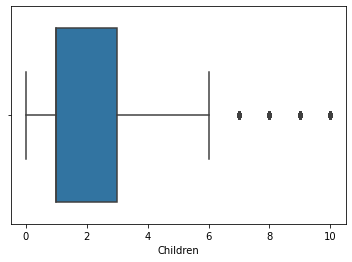

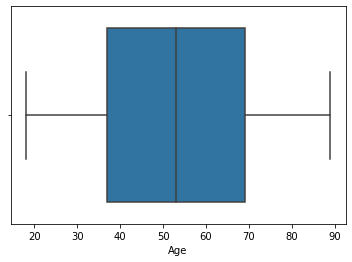

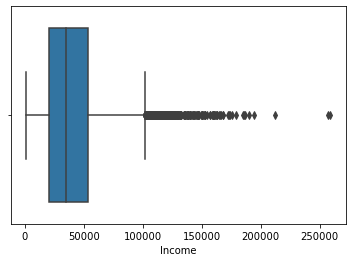

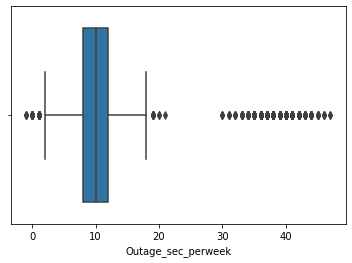

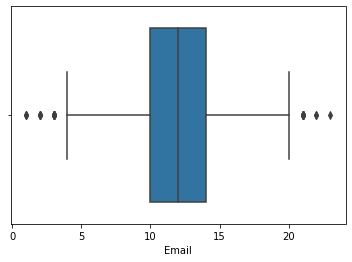

...

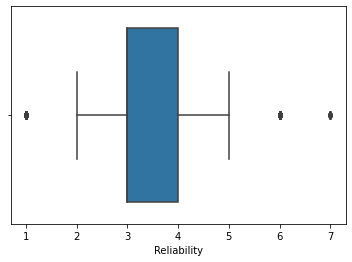

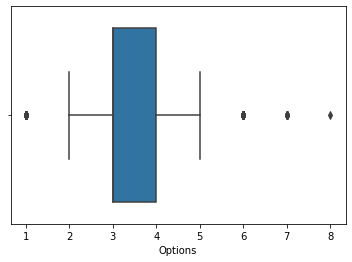

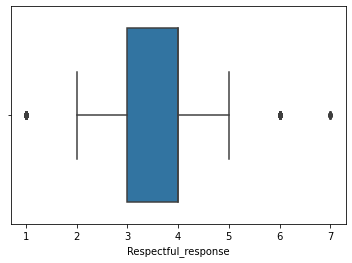

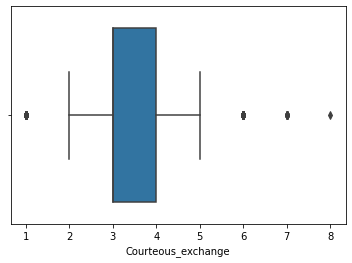

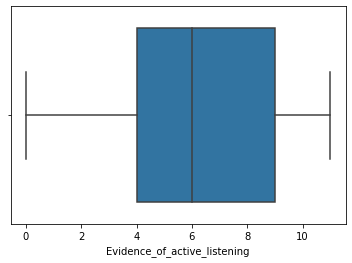

In [19]:
for column in Measures:
    plt.figure()    
    sns.boxplot(data = Measures, x =column);

<Figure size 432x288 with 0 Axes>

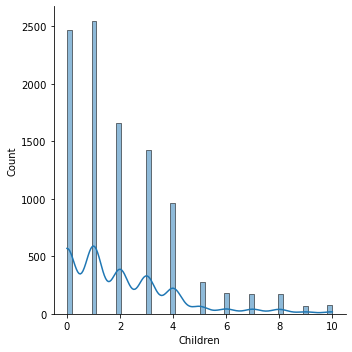

<Figure size 432x288 with 0 Axes>

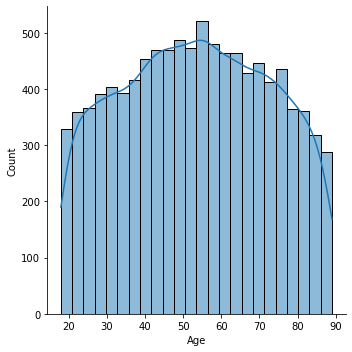

<Figure size 432x288 with 0 Axes>

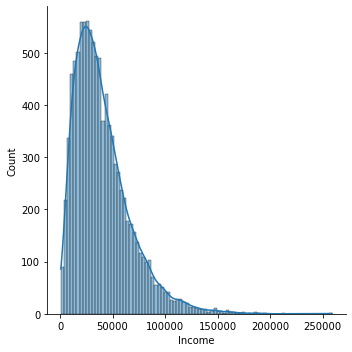

<Figure size 432x288 with 0 Axes>

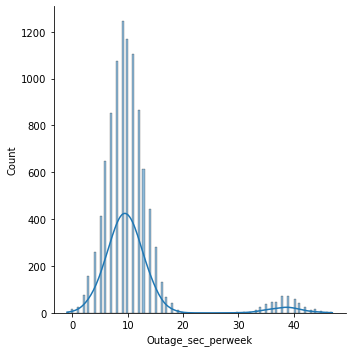

<Figure size 432x288 with 0 Axes>

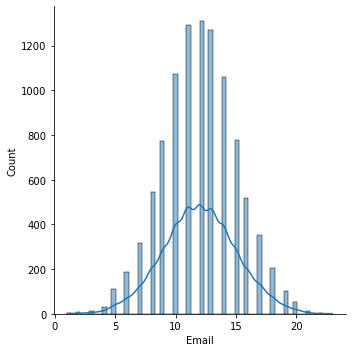

<Figure size 432x288 with 0 Axes>

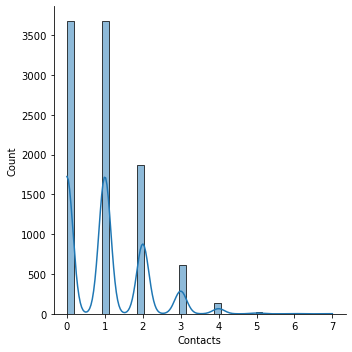

<Figure size 432x288 with 0 Axes>

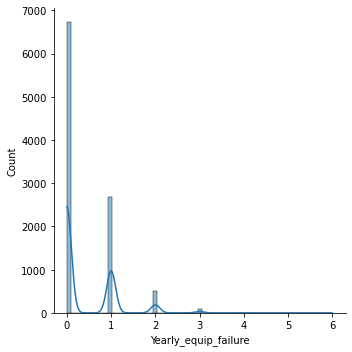

<Figure size 432x288 with 0 Axes>

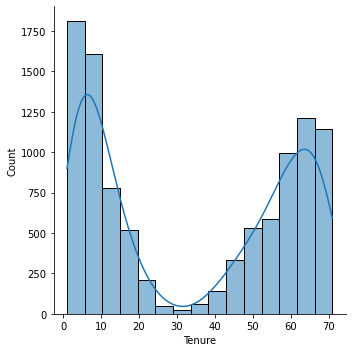

<Figure size 432x288 with 0 Axes>

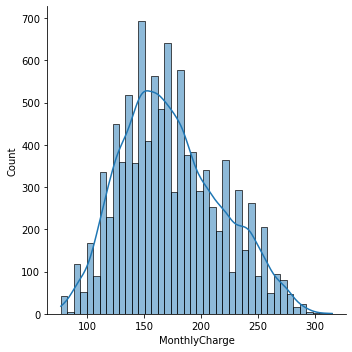

<Figure size 432x288 with 0 Axes>

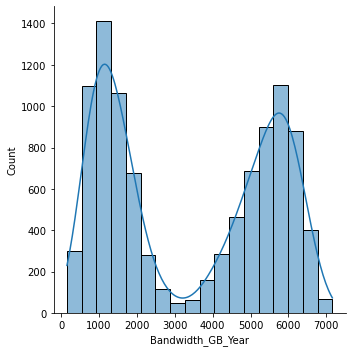

<Figure size 432x288 with 0 Axes>

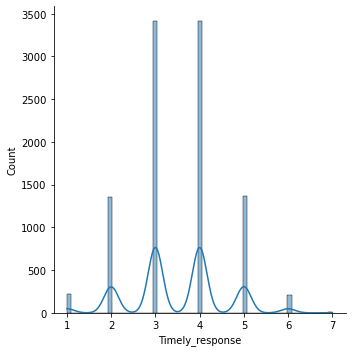

<Figure size 432x288 with 0 Axes>

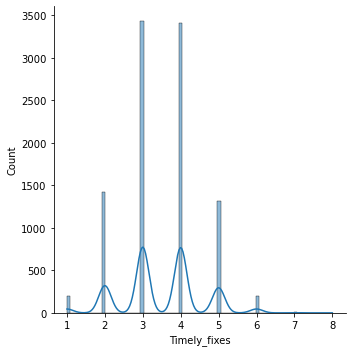

<Figure size 432x288 with 0 Axes>

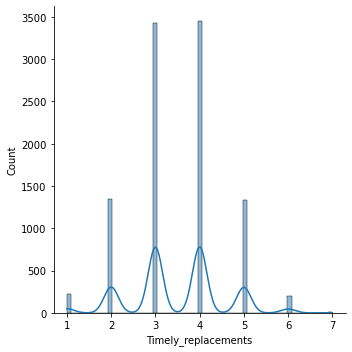

<Figure size 432x288 with 0 Axes>

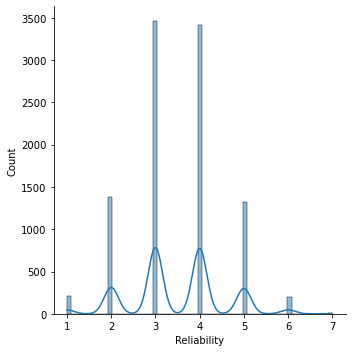

<Figure size 432x288 with 0 Axes>

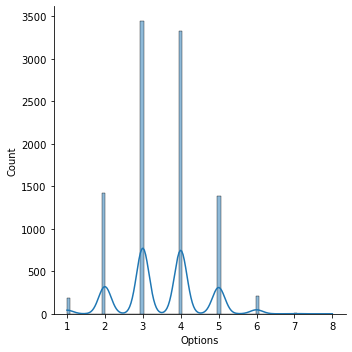

<Figure size 432x288 with 0 Axes>

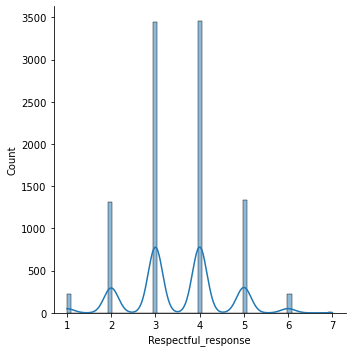

<Figure size 432x288 with 0 Axes>

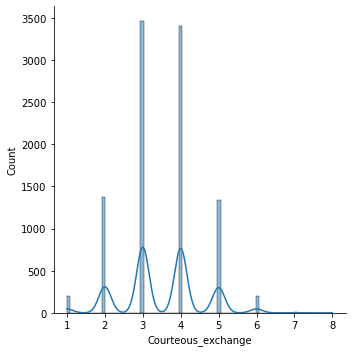

<Figure size 432x288 with 0 Axes>

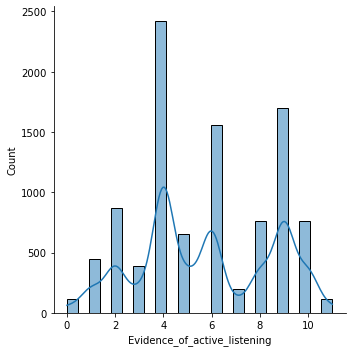

In [20]:
for column in Measures:
    plt.figure()    
    sns.displot(data = Measures, x =column, kde = True);

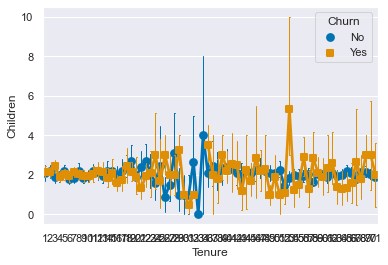

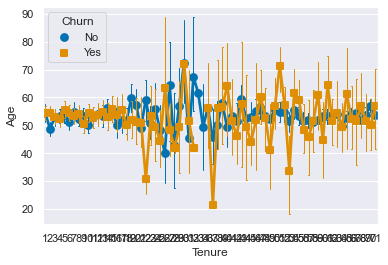

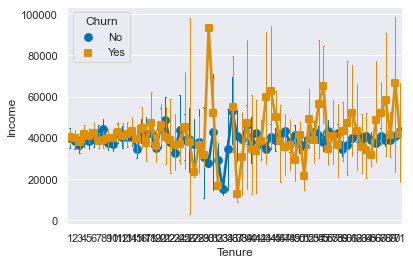

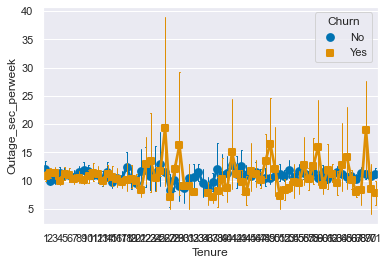

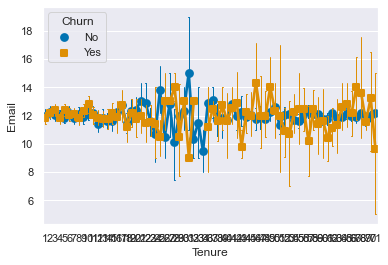

...

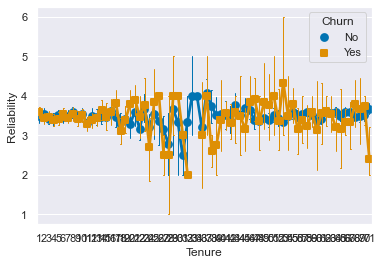

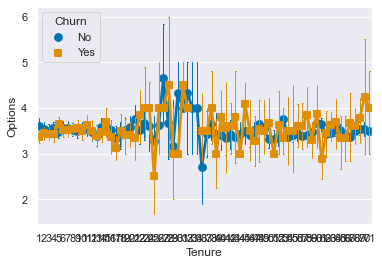

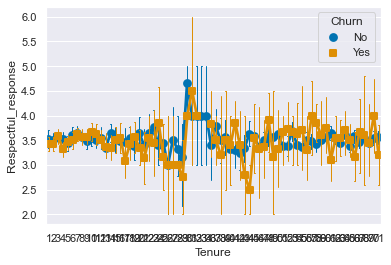

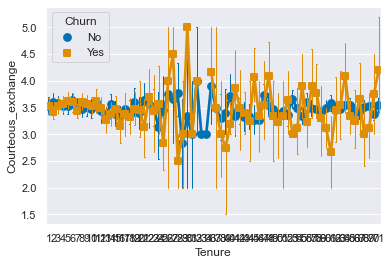

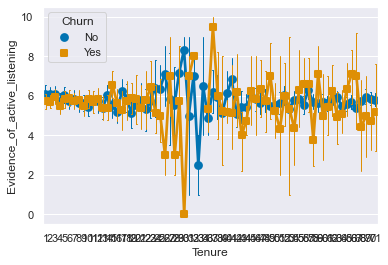

In [21]:
import seaborn as sns
for column in Measures:
    plt.figure()    
    sns.set()
    sns.pointplot(data=df, x='Tenure', y=column, hue='Churn', dodge=True, markers=['o', 's'],
	      capsize=.1, errwidth=1, palette='colorblind')




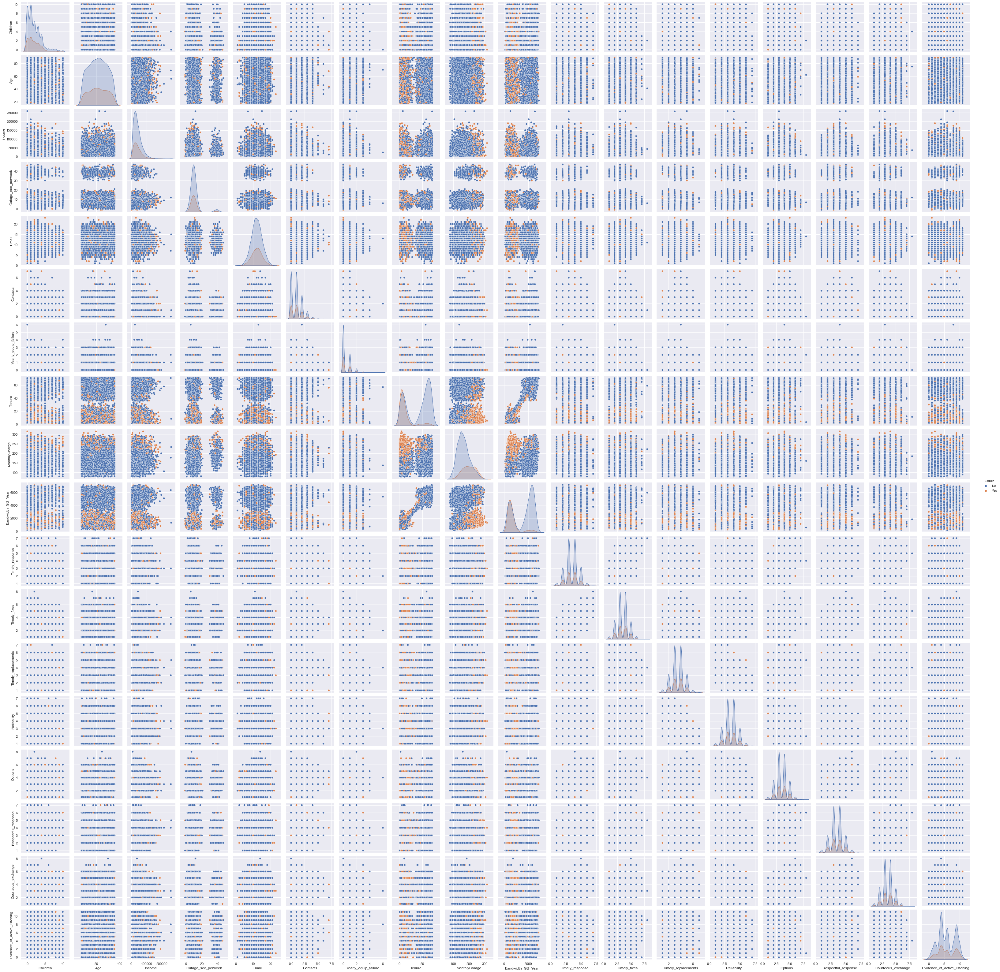

In [22]:
# Review Measures relationships to Churn
sns.pairplot(Meas_Churn, hue = 'Churn')

# Initial Univariate Analysis

In [23]:
def unistats(df):
    #create headers
    output_df = pd.DataFrame(columns =['Count','Missing', 'Unique', 'Dtype', 'Numeric', 'Mode', 'Mean', 'Min',
                                       '25%', 'Median', '75%','Max', 'Std', 'Skew', 'Kurt'])
    
    for col in df:
        if pd.api.types.is_numeric_dtype(df[col]):
            output_df.loc[col] = [df[col].count(),df[col].isnull,df[col].nunique(),df[col].dtype, pd.api.types.is_numeric_dtype(df[col]),
                                 df[col].mode().values[0],df[col].mean(),df[col].min(),df[col].quantile(0.25),df[col].median(),
                                 df[col].quantile(0.75),df[col].max(),df[col].std(),df[col].skew(),df[col].kurt()]
        else:
            output_df.loc[col] = [df[col].count(),df[col].isnull,df[col].nunique(),df[col].dtype, pd.api.types.is_numeric_dtype(df[col]),
                                  '','','','','','','','','','']
    return output_df.sort_values(by=['Numeric','Skew','Unique'], ascending = False)
unistats(df)

,Count,Missing,Unique,Dtype,Numeric,Mode,Mean,Min,25%,Median,75%,Max,Std,Skew,Kurt
Outage_sec_perweek,10000,<bound method Series.isnull of 0 6\n1 ...,41,int32,True,9,10.9471,-1,8.0,10.0,12.0,47,7.032258,2.955881,9.621766
Population,10000,<bound method Series.isnull of 0 38\n...,5933,int64,True,0,9756.5624,0,738.0,2910.5,13168.0,111850,14432.698671,2.205008,5.516785
Yearly_equip_failure,10000,<bound method Series.isnull of 0 1\n1 ...,6,int64,True,0,0.398,0,0.0,0.0,1.0,6,0.635953,1.660304,3.1031
Income,10000,<bound method Series.isnull of 0 28561\n...,9387,int32,True,2842,40099.934,740,20710.0,34377.0,53027.25,258900,26748.908155,1.43143,3.362082
Children,10000,<bound method Series.isnull of 0 1\n1 ...,11,int32,True,1,2.0378,0,1.0,1.0,3.0,10,2.04034,1.428476,2.243293
Contacts,10000,<bound method Series.isnull of 0 0\n1 ...,8,int64,True,0,0.9942,0,0.0,1.0,2.0,7,0.988466,0.981662,1.058689
MonthlyCharge,10000,<bound method Series.isnull of 0 171\n1 ...,215,int32,True,162,173.5834,77,141.0,169.0,203.0,315,43.336583,0.381137,-0.446153
Options,10000,<bound method Series.isnull of 0 4\n1 ...,8,int64,True,3,3.4973,1,3.0,3.0,4.0,8,1.033586,0.075986,-0.152186
Tenure,10000,<bound method Series.isnull of 0 6\n1 ...,70,int32,True,2,33.9903,1,7.0,35.0,61.0,71,26.393247,0.066478,-1.771639
Bandwidth_GB_Year,10000,<bound method Series.isnull of 0 904\n1...,4291,int32,True,5640,3393.9805,155,1238.0,3287.0,5583.0,7158,2185.665808,0.065737,-1.713805


BI Variate column to column

In [24]:
def bivstats(df, label):
    from scipy import stats
    import pandas as pd
    import numpy as np
    
    #Create Empty dataframe to store output
    output_df = pd.DataFrame(columns=['r', 'F', 'X2', 'p-value'])
    
    for col in df:
        if not col == label:
            if df[col].isnull().sum()==0:
                if pd.api.types.is_numeric_dtype(df[col]): # only calculate r, p-value for the numeric 
                    r, p = stats.pearsonr(df[label], df[col])
                    output_df.loc[col] = [round(r,3), np.nan, np.nan, round(p,6)]
            else:
                output_df.loc[col] = [np.nan, np.nan, np.nan, 'nulls']
    return output_df.reindex(output_df.r.abs().sort_values(ascending = False).index)
bivstats(df, 'Tenure')

,r,F,X2,p-value
Bandwidth_GB_Year,0.981,NaN,NaN,0.000000
Reliability,0.023,NaN,NaN,0.020861
Courteous_exchange,-0.017,NaN,NaN,0.081779
Email,-0.013,NaN,NaN,0.202929
Yearly_equip_failure,0.013,NaN,NaN,0.204518
Children,-0.012,NaN,NaN,0.225822
Evidence_of_active_listening,-0.010,NaN,NaN,0.337242
Options,-0.009,NaN,NaN,0.366060
Outage_sec_perweek,0.008,NaN,NaN,0.399068
item1,-0.006,NaN,NaN,0.579101


In [25]:
def anova(df, feature, label):
    import pandas as pd
    import numpy as np
    from scipy import stats
    # use the unique() to generate a list of unique values in catigorical column
    groups = df[feature].unique()
    # print(groups)
    df_grouped = df.groupby(feature)
    #print(df_grouped)
    group_labels = []
    for g in groups:
        g_list = df_grouped.get_group(g)
        #print(g_list)
        group_labels.append(g_list[label])
    #print(group_labels)
    return stats.f_oneway(*group_labels)

In [26]:
def bivstats(df, label):
    from scipy import stats
    import pandas as pd
    import numpy as np
    
    #Create Empty dataframe to store output
    output_df = pd.DataFrame(columns=['Stat','r(+/1)', 'Effect Size','p-value'])
    
    for col in df:
        if not col == label:
            if df[col].isnull().sum()==0:
                if pd.api.types.is_numeric_dtype(df[col]): # only calculate r, p-value for the numeric 
                    r, p = stats.pearsonr(df[label], df[col])
                    output_df.loc[col] = ['r', np.sign(r), abs(round(r,3)), round(p,6)]
                else:
                    F, p = anova(df[[col, label]], col, label)
                    output_df.loc[col] =  ['F', '', round(F,3), round(p,6)]
                    
            else:
                output_df.loc[col] = [np.nan, np.nan, np.nan, np.nan]
                
    return output_df.sort_values(by=['Stat','Effect Size'], ascending = [False, False])
bivstats(df, 'Tenure')

,Stat,r(+/1),Effect Size,p-value
Bandwidth_GB_Year,r,1.0,0.981,0.000000
Reliability,r,1.0,0.023,0.020861
Courteous_exchange,r,-1.0,0.017,0.081779
Email,r,-1.0,0.013,0.202929
Yearly_equip_failure,r,1.0,0.013,0.204518
Children,r,-1.0,0.012,0.225822
Evidence_of_active_listening,r,-1.0,0.010,0.337242
Options,r,-1.0,0.009,0.366060
Outage_sec_perweek,r,1.0,0.008,0.399068
item1,r,-1.0,0.006,0.579101


Tenure is closely related to Churn
Tenure is positively affected by (Top 3
    Categories :Device protection, OnlineBackup, Contract
    Measures : Bandwidth_GB_Year, Realiability, Yearly_equip_failure
Tenure is negatively affected by Courteous_exchange, Email, Children


# Joint Plot


In [27]:
def heteroscedasticity(df, feature, label ):
    import statsmodels.api as sm
    from statsmodels.formula.api import ols
    from statsmodels.stats.diagnostic import het_breuschpagan
    from statsmodels.stats.diagnostic import het_white
    # Fit the OLS model : ols(formula = '[label]~[feature], data=df').fit()
    model = ols(formula =(label + '~' + feature), data= df).fit()
    
    white_test = het_white(model.resid, model.model.exog)
    bp_test = het_breuschpagan(model.resid, model.model.exog)
    
    output_df = pd.DataFrame(columns = ['LM stat', 'LM p-value', 'F-stat', 'F p-value'])
    output_df.loc['White'] = white_test
    output_df.loc['Br-Pa']= bp_test
    return output_df.round(3)
    
   
def scatter(feature,label):
    from scipy import stats
    # Create Legend
    m, b, r, p, err = stats.linregress(feature, label)
    textstr = 'y  = ' + str(round(m,2)) +'x+ ' + str(round(b,2)) + '\n'
    textstr += 'r2 = ' + str(round(r**2,2)) +'\n'
    textstr += 'p  = ' + str(round(p,2)) +'\n'
    textstr += str(feature.name) + ' skew = ' + str(round(feature.skew(),2)) + '\n'
    textstr += str(label.name) + ' skew = ' + str(round(label.skew(),2)) + '\n'+'\n'
    textstr += str(heteroscedasticity(pd.DataFrame(label).join(pd.DataFrame(feature)), feature.name, label.name))
    
    sns.set(color_codes=True)
    ax = sns.jointplot(feature, label, kind = 'reg')
    ax.fig.text(1, 0.114, textstr, fontsize=12, transform=plt.gcf().transFigure)
    plt.show()
#scatter(df.Tenure, df.Bandwidth_GB_Year)

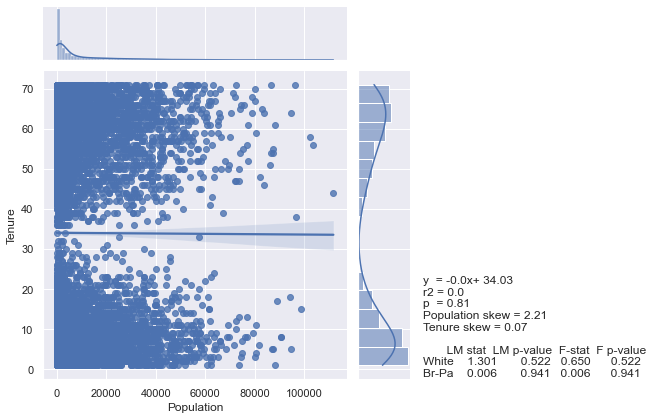

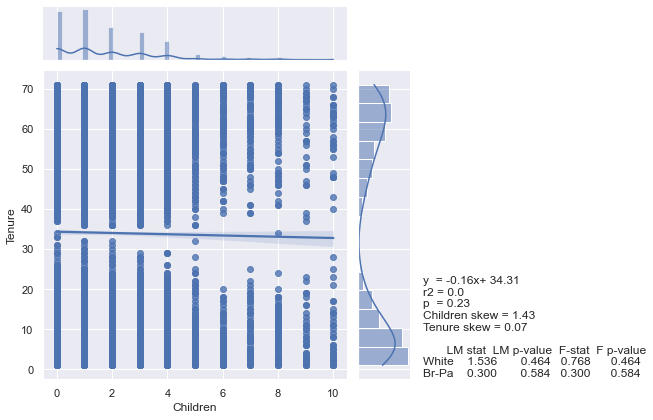

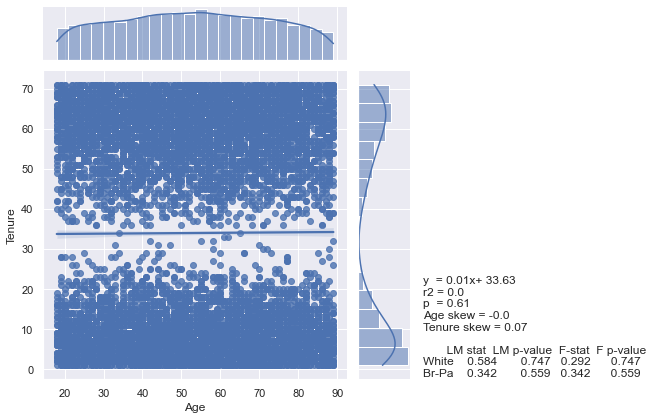

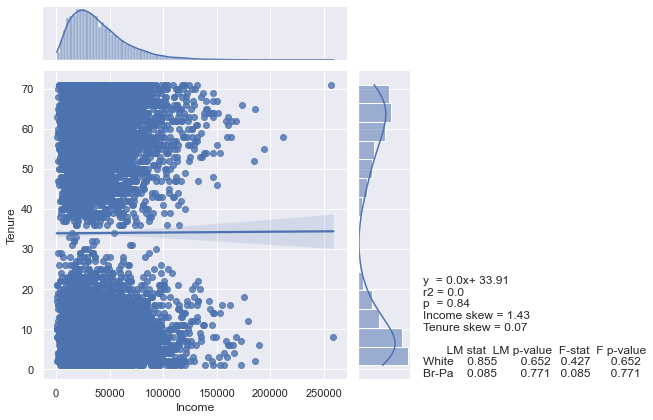

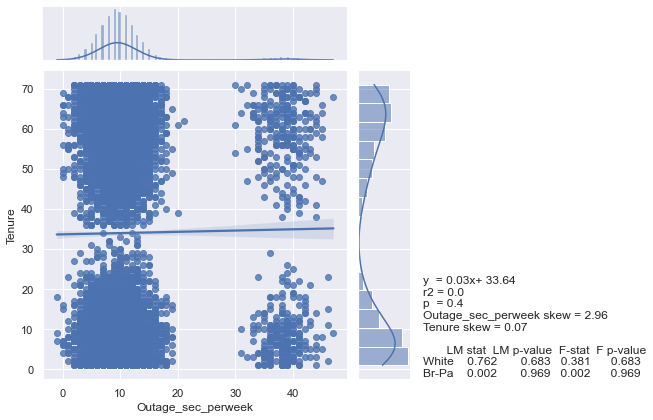

...

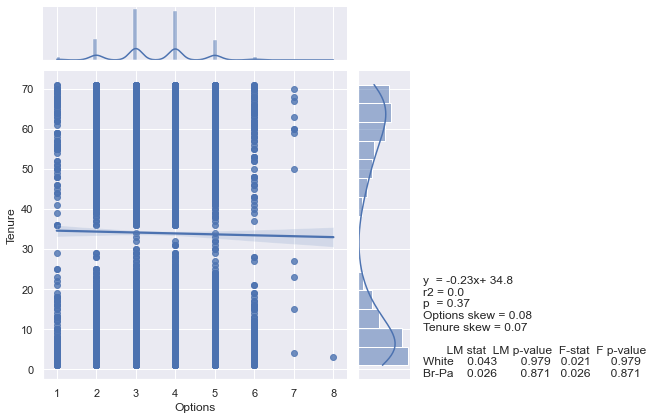

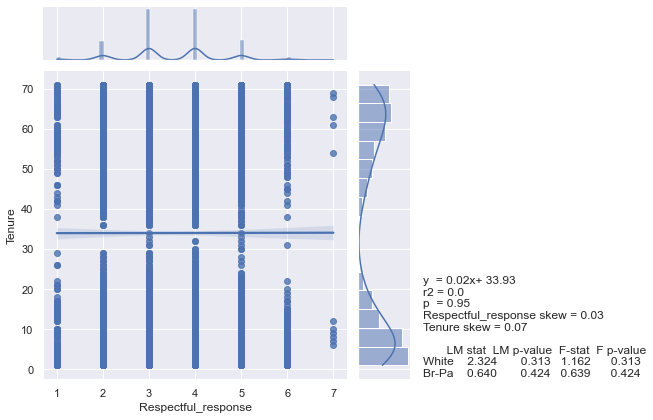

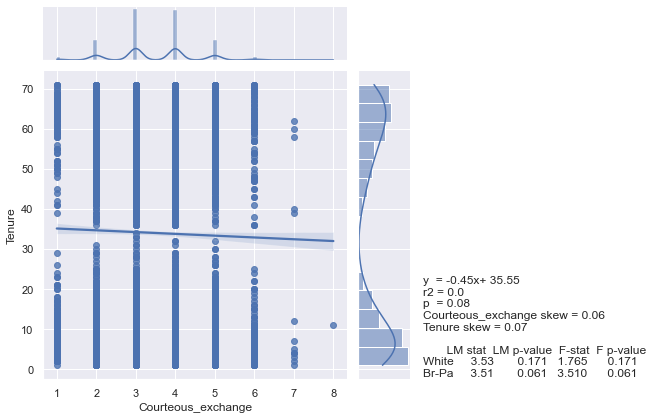

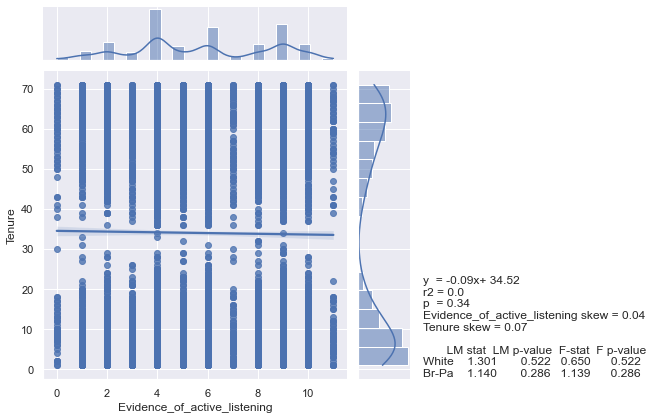

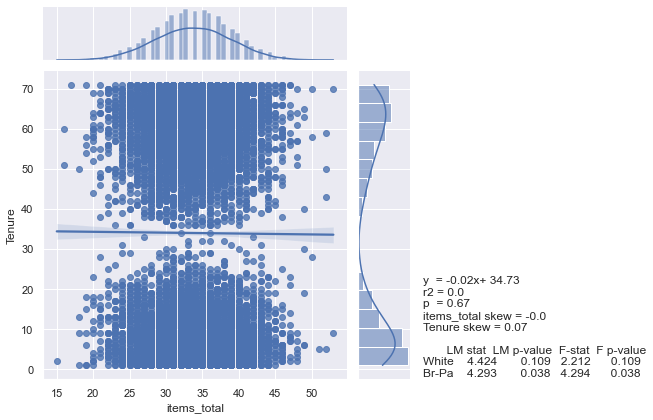

,Stat,r(+/1),Effect Size,p-value
Bandwidth_GB_Year,r,1.0,0.981,0.000000
Reliability,r,1.0,0.023,0.020861
Courteous_exchange,r,-1.0,0.017,0.081779
Email,r,-1.0,0.013,0.202929
Yearly_equip_failure,r,1.0,0.013,0.204518
Children,r,-1.0,0.012,0.225822
Evidence_of_active_listening,r,-1.0,0.010,0.337242
Options,r,-1.0,0.009,0.366060
Outage_sec_perweek,r,1.0,0.008,0.399068
item1,r,-1.0,0.006,0.579101


In [28]:
# remove insignificat xy warning
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
def bivstats(df, label):
    from scipy import stats
    import pandas as pd
    import numpy as np
    
    #Create Empty dataframe to store output
    output_df = pd.DataFrame(columns=['Stat','r(+/1)', 'Effect Size','p-value'])
    
    for col in df:
        if not col == label:
            if df[col].isnull().sum()==0:
                if pd.api.types.is_numeric_dtype(df[col]): # only calculate r, p-value for the numeric 
                    r, p = stats.pearsonr(df[label], df[col])
                    output_df.loc[col] = ['r', np.sign(r), abs(round(r,3)), round(p,6)]
                    scatter(df[col], df[label])
                else:
                    F, p = anova(df[[col, label]], col, label)
                    output_df.loc[col] =  ['F', '', round(F,3), round(p,6)]
                    
            else:
                output_df.loc[col] = [np.nan, np.nan, np.nan, np.nan]
                
    return output_df.sort_values(by=['Stat','Effect Size'], ascending = [False, False])
    plt.show()
bivstats(df, 'Tenure')


In [29]:
def bar_chart(df, feature, label):
    import pandas as pd
    from scipy import stats
    from matplotlib import pyplot as plt
    
    means = df.groupby(feature).mean()[label].round(2)
    
    plt.bar(df.groupby(feature).groups.keys(),means)
    plt.title(label + " by " + feature)
    plt.xlabel(feature)
    plt.ylabel(label)
    
    groups = df[feature].unique()
    df_grouped = df.groupby(feature)
    group_labels = []
    for g in groups:
        g_list = df_grouped.get_group(g)
        group_labels.append(g_list[label])
    
    #ANOVA
    oneway = stats.f_oneway(*group_labels)
    
    #t-test
    unique_groups = df[feature].unique()
    ttests = []
    
    for i, group in enumerate(unique_groups):
        for i2, group_2 in enumerate(unique_groups):
            if i2 >i:
                type_1 = df[df[feature] == group]
                type_2 = df[df[feature] == group_2]
                # There must be more than 1 case per gorup to perform a t-test
                if len(type_1[label]) < 2 or len(type_2[label]) <2:
                    print("''" + group + "''", str(len(type_1)) + "; '" + group_2 + "' n -'" +str(len(type_2)) + "; no t-test performed")
                else:
                    t, p = stats.ttest_ind(type_1[label], type_2[label])
                    ttests.append([group, group_2, t.round(4), p.round(4)])
                
    p_threshold = 0.05 / len(ttests)  # bonferroni- corrected p- value determined
    
    # add all descriptive statistics to the diagram
    textstr = '          ANOVA'  + '\n'
    textstr += 'F:             ' + str(oneway[0].round(2)) + '\n'
    textstr += 'p-value:       ' + str(oneway[1].round(2)) + '\n\n'
    textstr += 'Sig. comparisions (Bonferroni-corrected)' +  '\n'
    
    for ttest in ttests:
        if ttest[3] <= p_threshold:
            textstr += ttest[0] + '-' + ttest[1] + ": t=" + str(ttest[2]) + ", p=" + str(ttest[3]) + '\n'
    plt.text(1, 0.1, textstr, fontsize = 12, transform=plt.gcf().transFigure)
    plt.show()
#bar_chart(df, 'Gender', 'Tenure')

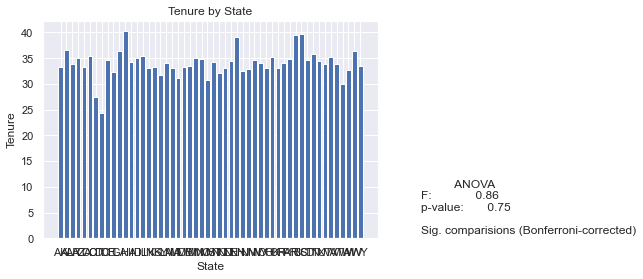

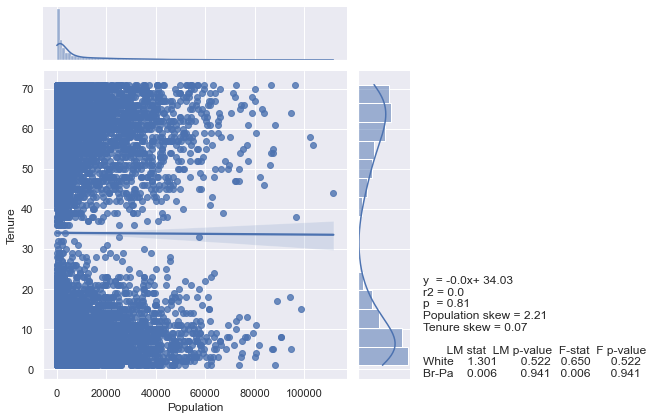

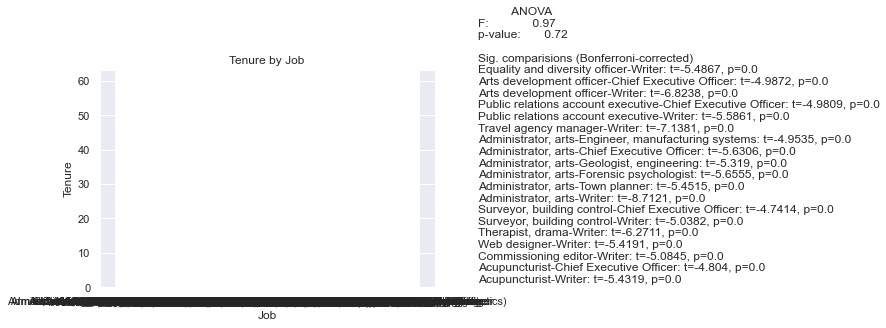

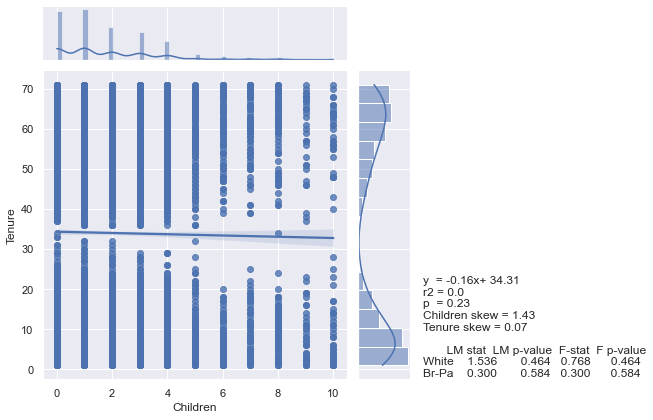

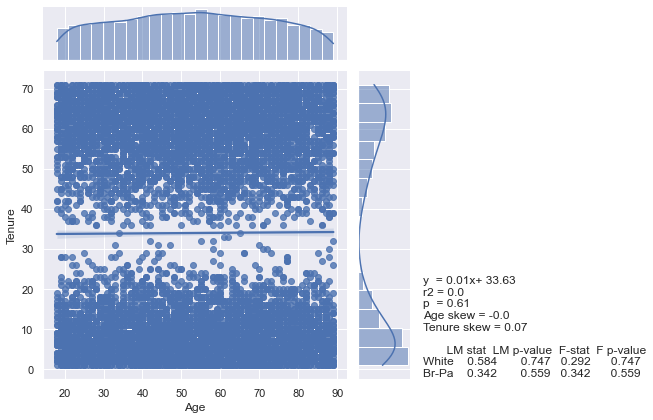

...

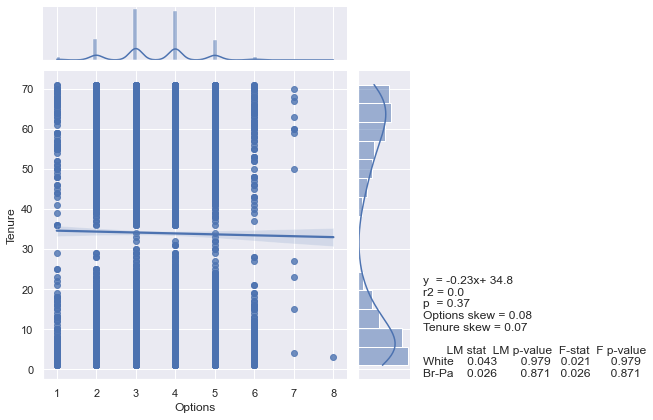

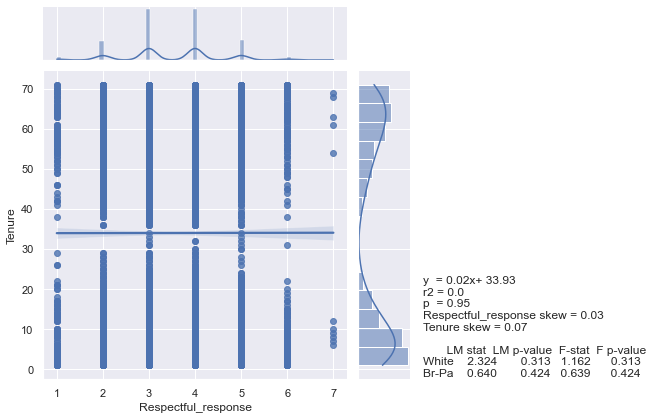

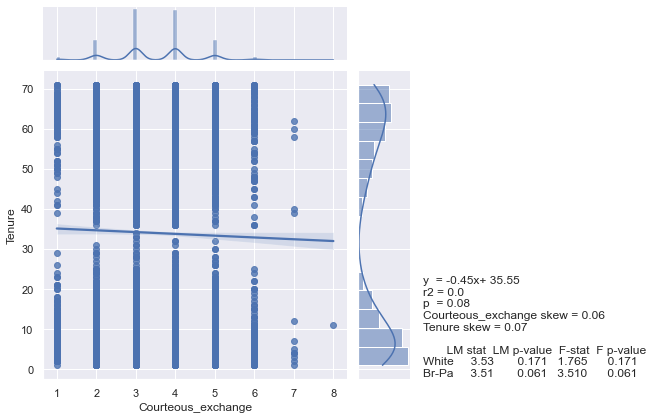

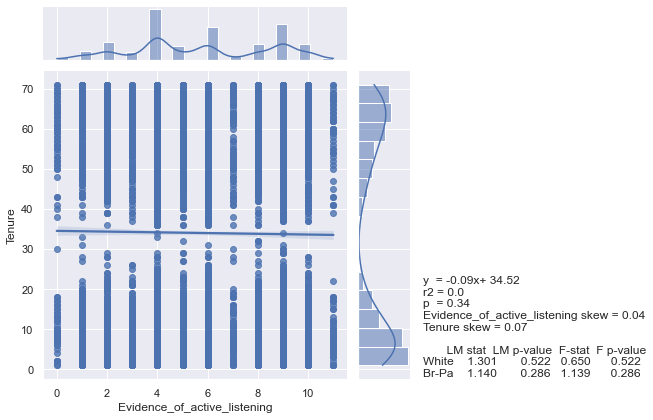

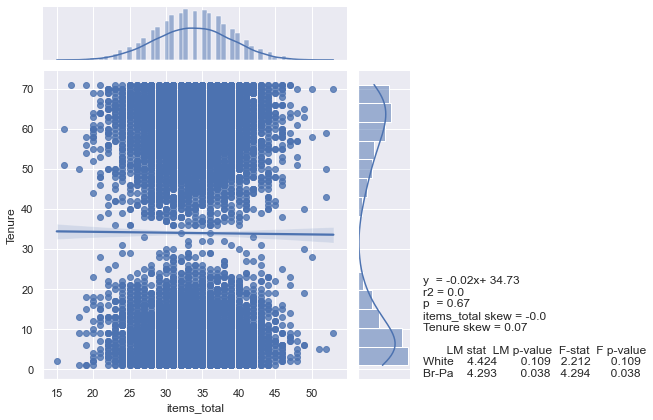

,Stat,r(+/1),Effect Size,p-value
Bandwidth_GB_Year,r,1.0,0.981,0.000000
Reliability,r,1.0,0.023,0.020861
Courteous_exchange,r,-1.0,0.017,0.081779
Email,r,-1.0,0.013,0.202929
Yearly_equip_failure,r,1.0,0.013,0.204518
Children,r,-1.0,0.012,0.225822
Evidence_of_active_listening,r,-1.0,0.010,0.337242
Options,r,-1.0,0.009,0.366060
Outage_sec_perweek,r,1.0,0.008,0.399068
item1,r,-1.0,0.006,0.579101


In [30]:
import warnings
warnings.simplefilter(action="ignore", category=FutureWarning)
def bivstats(df, label):
    from scipy import stats
    import pandas as pd
    import numpy as np
    
    #Create Empty dataframe to store output
    output_df = pd.DataFrame(columns=['Stat','r(+/1)', 'Effect Size','p-value'])
    
    for col in df:
        if not col == label:
            if df[col].isnull().sum()==0:
                if pd.api.types.is_numeric_dtype(df[col]): # only calculate r, p-value for the numeric 
                    r, p = stats.pearsonr(df[label], df[col])
                    output_df.loc[col] = ['r', np.sign(r), abs(round(r,3)), round(p,6)]
                    scatter(df[col], df[label])
                else:
                    F, p = anova(df[[col, label]], col, label)
                    output_df.loc[col] =  ['F', '', round(F,3), round(p,6)]
                    bar_chart(df, col, label)
            else:
                output_df.loc[col] = [np.nan, np.nan, np.nan, np.nan]
                
    return output_df.sort_values(by=['Stat','Effect Size'], ascending = [False, False])
    plt.show()
bivstats(df, 'Tenure')

# MLR/OLS STATS MODEL

In [38]:
#Prepare the data
def mlr_prepare(df):
    import pandas as pd
    import numpy as np
    from sklearn import preprocessing
    import statsmodels.api as sm
   

    for col in df:
        if not pd.api.types.is_numeric_dtype(df[col]):
            df = df.join(pd.get_dummies(df[col], prefix=col, drop_first=False))
    
    df = df.select_dtypes(np.number)
    df_minmax = pd.DataFrame(preprocessing.MinMaxScaler().fit_transform(df), columns=df.columns)
    return df_minmax

In [39]:
def mlr(df, label): # Run actual MLR
    import numpy as np
    import pandas as pd
    import statsmodels.api as sm
    y = df[label]
    x = df.drop(columns= [label]).assign(const=1)
    results = sm.OLS(y,x).fit()
    return results

In [40]:
def mlr_fit(results, actual, roundto = 10): # calculate fit statistics and record entry for modeling table
    import numpy as np
    df_features = mlr_feature_df(results)# Generate feature table that allows sorting coef labels based on t and p
    residuals = np.array(actual) - np.array(results.fittedvalues)
    rmse = np.sqrt(sum(residuals**2))//len(actual)
    mae = np.mean(abs(np.array(actual)-np.array(results.fittedvalues)))
    fit_stats = [ round(results.rsquared, roundto), round(results.rsquared_adj, roundto),
                  round(results.rsquared - results.rsquared_adj, roundto), round(rmse, roundto),
                  round(mae, roundto), [df_features.index.values]]
    return fit_stats

In [41]:
def mlr_feature_df(results): # create dataframe that will allow sort on t and p
    
    df_features = pd.DataFrame({'coef':results.params, 't':abs(results.tvalues), 'p':results.pvalues})
    
    df_features.drop(labels=['const'], inplace = True)
    df_features = df_features.sort_values(by=['t', 'p'])
    return df_features



In [42]:
def mlr_step(df, label, min=2): #Control mlr_fit by removing X criteria at a time
    # Create empty model results table
    df_models = pd.DataFrame(columns=['R2', 'R2a', 'diff', 'RMSE', 'MAE', 'features'])
    
    # prepare the data by generating dummies and scaling
    df = mlr_prepare(df)
    
    # run the first model with all features
    results = mlr(df, label)
    
    #Generate the fit statistics for th og model
    df_models.loc[str(len(results.params))] = mlr_fit(results, df[label], 10)
    
    # Generate feature table that allows sorting coef labels based on t an p
    df_features = mlr_feature_df(results)
    
    # step through a series of reduced models 
    while len(results.params)>=min:            # Keep looping as long as there are at least a minimum number of features left
        df = df.drop(columns = [df_features.index[0]])  # Drop the least effective features
        results = mlr(df, label) #re-run the next mlr
        df_features = mlr_feature_df(results) #regenerate the summary table
        df_models.loc[len(results.params)] = mlr_fit(results, df[label], 10)
        
    # save the full models table to CSV
    df_models.to_csv('C://Users//msmorris//Documents//'+ label + '.csv')
    
    # Return to display a shorter version without feature list
    df_models.drop(columns=['features'], inplace = True)
    return df_models
        

In [43]:
df.head()

,State,Population,Job,Children,Age,Education,Employment,Income,Marital,Gender,...,item1,Timely_response,Timely_fixes,Timely_replacements,Reliability,Options,Respectful_response,Courteous_exchange,Evidence_of_active_listening,items_total
0,AK,38,Environmental health practitioner,1,68,Master's Degree,Part Time,28561,Widowed,Male,...,5,5,5,3,4,4,3,4,10,43
1,MI,10446,"Programmer, multimedia",1,27,Regular High School Diploma,Retired,21704,Married,Female,...,3,4,3,3,4,3,4,4,4,33
2,OR,3735,Chief Financial Officer,4,50,Regular High School Diploma,Student,20315,Widowed,Female,...,4,4,2,4,4,3,3,3,4,31
3,CA,13863,Solicitor,1,48,Doctorate Degree,Retired,18925,Married,Male,...,4,4,4,2,5,4,3,3,11,40
4,TX,11352,Medical illustrator,0,83,Master's Degree,Student,40074,Separated,Male,...,4,4,4,3,4,4,4,5,10,42


In [44]:
df_models = mlr_step(df,'Tenure')
df_models

,R2,R2a,diff,RMSE,MAE
773,0.978284,0.976528,0.001756,0.0,0.029980
772,0.978284,0.976528,0.001756,0.0,0.029980
771,0.978284,0.976531,0.001753,0.0,0.029980
770,0.978284,0.976533,0.001751,0.0,0.029980
769,0.978284,0.976536,0.001748,0.0,0.029980
...,...,...,...,...,...
5,0.974639,0.974629,0.000010,0.0,0.033465
4,0.971671,0.971663,0.000009,0.0,0.039679
3,0.966394,0.966387,0.000007,0.0,0.049119
2,0.963096,0.963092,0.000004,0.0,0.052418


# Cleaning Findings

Missing Data from the Data set that will need to be imputed or removed was discovered. 

Children                2495
Age                     2475
Income                  2490
Techie                  2477
Phone                   1026
TechSupport              991
Tenure                   931
Bandwidth_GB_Year       1021



# Justification of mitigation methods

While median was one choice it increased Kurtosis.  I tried linear interpolation seemed a more reasonable approach. 
This left 1 record not imputed for Children which I chose median to remedy.

For categorical dimensions Techie, TechSupport, Phone will be transformed using SimpleImputer. 

# Summary of the outcomes

Using linear interpolation had a better effect for overal distribution of data then median once imputed.
Data anomolies by definition do not appear to exist but outliers do. Instead of dropping Outliers they will be scaled to fit. 


# Mitigation Code

In [45]:
# Slice off all but last eleven service realted variables
data = df[['Children', 'Income', 'Outage_sec_perweek', 'Email', 'Contacts', 
                 'Yearly_equip_failure', 'MonthlyCharge']]
data.head()


,Children,Income,Outage_sec_perweek,Email,Contacts,Yearly_equip_failure,MonthlyCharge
0,1,28561,6,10,0,1,171
1,1,21704,12,12,0,1,242
2,4,20315,10,9,0,1,159
3,1,18925,15,15,2,0,120
4,0,40074,8,16,2,1,150


In [46]:
# Normalize the data
df_norm = (data - data.mean()) / data.std()

In [47]:
df['Children'] = df_norm['Children']
df['Income'] = df_norm['Income']
df['Outage_sec_perweek'] = df_norm['Outage_sec_perweek']
df['Email'] = df_norm['Email']
df['Contacts'] = df_norm['Contacts']
df['Yearly_equip_failure'] = df_norm['Yearly_equip_failure']
df['MonthlyCharge'] = df_norm['MonthlyCharge']

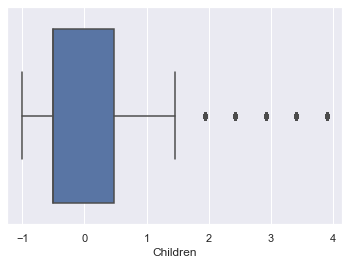

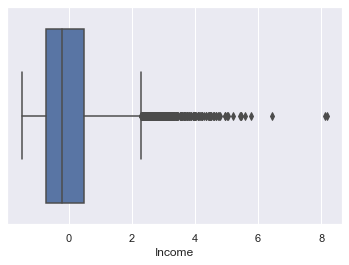

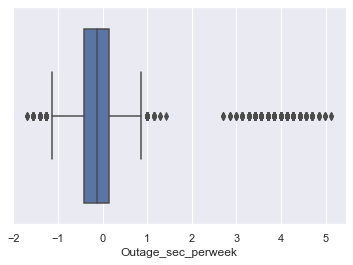

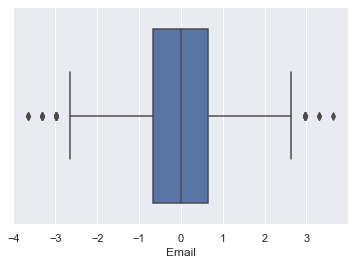

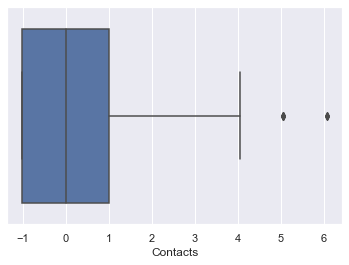

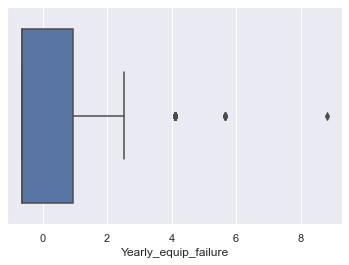

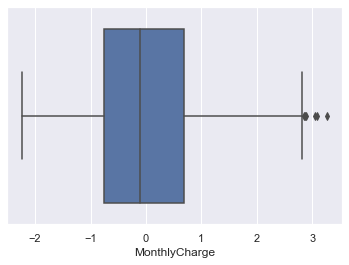

In [48]:
for column in df_norm:
    plt.figure()    
    sns.boxplot(data = df_norm, x =column);

In [49]:
###############################################################################
# Clean Data
###############################################################################

df.to_csv('C://Users//msmorris//Documents//'+'df_clean'+ '.csv')

# .CSV has been attatched with clean data

# Limitations

NA's are unknown and assumptions have been made with no business requirements.
There is no customer for user acceptance checking or threshhold checks. 
There are no Time elements and I do believe time of year would have a major impact on
results. 



# Impact of the Limitations

The impact of discussed limitation makes the initial project more of a proof of concept. 
There is value in the outputs but customer input and more data will add more value to the 
output relevency. 


###############################################################################
# Criteria Used
###############################################################################

For PCA I chose to use measure to review over Churn:

Children, Age, Income, Outage_sec_perweek, Email, Contacts, Yearly_equip_failure, Tenure,MonthlyCharge,Bandwidth_GB_Year, Timely_response, Timely_fixes, Timely_replacements, Reliability, Options, Respectful_response, Courteous_exchange,Evidence_of_active_listening

In [52]:
from sklearn.decomposition import PCA
# Select number of components to extract
pca = PCA(n_components = df.shape[1])

In [53]:
# Create a list of PCA names
churn_numeric = (df[['Children', 'Age', 'Income', 'Outage_sec_perweek', 'Email', 'Contacts', 
                 'Yearly_equip_failure', 'Tenure','MonthlyCharge','Bandwidth_GB_Year', 'Timely_response', 'Timely_fixes',
                 'Timely_replacements', 'Reliability', 'Options', 'Respectful_response', 'Courteous_exchange', 
                 'Evidence_of_active_listening']])
pcs_names = []
for i, col in enumerate(churn_numeric.columns):
    pcs_names.append('PC'+ str(i + 1))
print(pcs_names)

['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16', 'PC17', 'PC18']


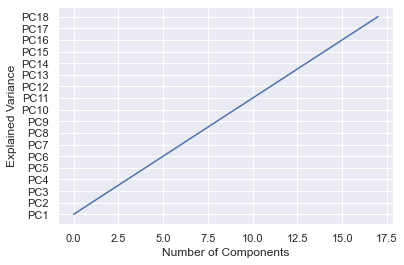

In [54]:
# Run the scree plot
plt.plot(pcs_names)
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.show();

In [55]:
from sklearn.decomposition import PCA
df = df[['Children', 'Age', 'Income', 'Outage_sec_perweek', 'Email', 'Contacts', 
                 'Yearly_equip_failure', 'Tenure','MonthlyCharge','Bandwidth_GB_Year', 'Timely_response', 'Timely_fixes',
                 'Timely_replacements', 'Reliability', 'Options', 'Respectful_response', 'Courteous_exchange', 
                 'Evidence_of_active_listening']]
df =df.fillna(df.median())
df_normalized=(df-df.mean())/df.std()
pca = PCA(n_components=df.shape[1])


pca.fit(df_normalized)
df_pca = pd.DataFrame(pca.transform(df_normalized),     
     columns=['PC1','PC2','PC3','PC4','PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10','PC11','PC12','PC13','PC14','PC15', 'PC16', 'PC17', 'PC18'])
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,1.151760,-1.415366,1.947213,-0.238087,0.333477,0.561942,1.341595,-1.469435,-0.290220,-1.223848,0.206605,-0.337629,0.017497,-0.865549,-0.231301,-0.092124,0.114246,-0.031631
1,-0.034299,-1.598297,0.542871,1.413037,0.849547,-0.584626,1.215554,0.975601,-0.586830,-0.140061,0.310783,-1.229630,0.634279,0.776122,0.488379,0.175792,0.618976,-0.038837
2,-0.944414,-0.985049,-0.325198,-0.337418,1.487867,0.439151,1.026232,0.591972,0.006117,-0.243549,-0.977871,0.032656,-0.071941,-0.167064,0.224992,0.957466,1.193106,0.069459
3,-0.535469,-0.864537,2.081711,-0.135219,-0.863164,-1.458947,0.181571,-1.642406,0.405697,0.590368,0.756438,1.396331,-0.328662,0.052787,-0.833588,0.446140,-0.158706,0.119553
4,1.195391,-1.851306,1.026788,-0.360082,-1.631627,0.206504,0.586074,-1.488571,1.492008,-0.763382,1.189914,0.298968,1.095191,0.369249,-0.005164,0.160867,-0.157264,-0.067383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-2.173713,1.754950,-0.274733,-0.541767,-0.229205,0.045790,-0.935456,0.068428,0.174161,1.000016,-0.066885,0.116663,0.434240,-0.538909,-0.564699,-0.098814,-0.717890,0.091397
9996,1.632116,1.625598,1.192435,0.400029,-0.409763,-0.662996,-0.960297,0.401911,0.838016,0.731305,-0.578527,-0.623198,1.295240,-2.210156,-0.689948,0.543679,-0.188142,-0.038503
9997,1.276287,1.197773,0.406630,-0.910735,0.465754,-0.203355,0.043520,1.472137,-1.244763,-0.202820,-0.896808,-0.444736,1.166253,-0.002476,0.413255,0.562879,-0.244016,-0.622484
9998,1.843785,2.173065,0.517078,1.363211,-0.354251,-1.547320,0.166150,-1.124429,-0.468575,0.078444,0.164111,-1.082008,-0.463437,0.008912,1.565687,-1.093172,-0.960083,-0.066334


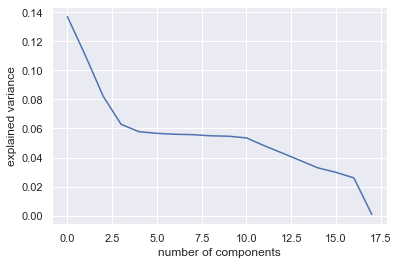

In [56]:
import matplotlib.pyplot as plt

import seaborn as sns
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('explained variance')
plt.show()

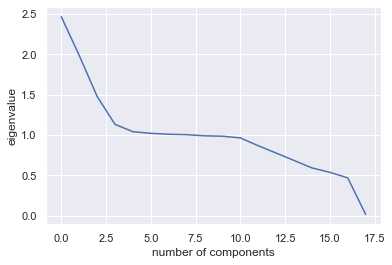

In [57]:
#extract eiganvalues
import numpy as np
cov_matrix = np.dot(df_normalized.T, df_normalized) / df.shape[0]
eigenvalues = [np.dot(eigenvector.T, np.dot(cov_matrix, eigenvector)) for
eigenvector in pca.components_]

plt.plot(eigenvalues)
plt.xlabel('number of components')
plt.ylabel('eigenvalue')
plt.show() 

loadings = pd.DataFrame(pca.components_.T,
     columns=['PC1','PC2','PC3','PC4','PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10','PC11','PC12','PC13','PC14','PC15', 'PC16', 'PC17', 'PC18'],
     index=df.columns)

# Principle Components

Review Scree plot Eigenvalue value elbows at about 3 components and then another drop around 9 components
After the MLR review the features of interest are: 

for first elbow would be 
* Children, 
* MonthlyCharge, 
* Bandwidth_GB_Year


For second elbow
* Children, 
* MonthlyCharge, 
* Bandwidth_GB_Year, 
* Age, 
* Outage_sec_perweek, 
* Courteous_Exchange, 
* Timely_Fixes, 
* Timely_Replacements, 
* Options

# Benefits

Based on results organization can immediatly focus on Courteous Exchange, Timely fixes and replacements to increase Customer retention. A review on MonthlyCharge and Bandwidth_GB_Year could use further analysis to create scenarios and recommendations on the right scenarios to reduce Churn. 